## Prototype LABELATOR

### overview.
This notebook protypes a "labelator".  The purpose of a "labelator" is to easily create _cell types_ for "Probe" data.

Currently we are prototyping with `scarches` to enable  SCVI / SCANVI models.  Crucially it is their anndata loader which is especially useful. AND to state our confirmation bias impliments the SCVI models which we like.

We will validate potential models and calibrate them with simple expectations using a typical "Train" "Test" ("Validate") and "Probe" approach.  

Definitions:
- "Train": data samples on which the model being tested is trained.
- "Validate":  held-out samples, to test out-of-sample prediction fidelity.
- "Probe": data generated elsewhere, which is _probing_ the fidelity of the model.

### Models:
- SCVI
- logistic regression
- boosted trees (e.g. xgboost)

### Modules:

- `data`: gene x barcode count matrices.  These will be packaged in anndata objects and leverage the scvi-tools / scarches framework for loading
- `train`
- `validate`
- `probe`

### Imports and scvi-tools installation (colab)

In [1]:
import sys

IN_COLAB = "google.colab" in sys.modules
if IN_COLAB:
    !pip uninstall -y typing_extensions
    !pip install --quiet scvi-colab
    from scvi_colab import install
    install()
    !pip install --quiet scrublet

In [13]:
import sys
import warnings

import anndata as ad
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import scvi
from pathlib import Path

import torch
torch.set_float32_matmul_precision("medium")  




In [3]:
if IN_COLAB:
    from google.colab import drive
    drive.mount('/content/drive')

In [4]:
warnings.simplefilter(action="ignore", category=FutureWarning)


sc.set_figure_params(figsize=(4, 4))
scvi.settings.seed = 94705

%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
%config InlineBackend.figure_format='retina'

Global seed set to 94705


## Data

### Load

In [5]:
XYLENA_ANNDATA = "brain_atlas_anndata.h5ad"
XYLENA_METADATA = "final_metadata.csv"
XYLENA_ANNDATA2 = "brain_atlas_counts.h5ad"


In [6]:
if IN_COLAB:
    root_path = Path("/content/drive/MyDrive/")
    data_path = root_path / "SingleCellModel/data"
else:
    root_path = Path("../")
    data_path = root_path / "data/scdata/xylena_raw"





In [7]:
# data_file = data_path / XYLENA_ANNDATA.replace(".h5ad", "_updated.h5ad")

# raw_ad = ad.read_h5ad(data_file)


# get train and validation adatas

In [8]:

outfilen = data_path / XYLENA_ANNDATA.replace(".h5ad", "_train.h5ad")
train_ad = ad.read_h5ad(outfilen)


# outfilen = data_path / XYLENA_ANNDATA.replace(".h5ad", "_val.h5ad")
# val_ad = ad.read_h5ad(outfilen)

## Preprocessing

We might need to make some auxillary metadata for the dataset. We will use the cell type annotations from the original paper, and we will also make a cell type annotation for the doublets.
    

### Train, Validate

## Model

### Train

### Validate with 

### Reference mapping with SCVI

We already have highly variable gene selected

## Test & Probe



#### Train reference

We train the reference using the standard SCVI workflow, except we add a few non-default parameters that were identified to work well with scArches.

In [9]:
# check dtype of X ... should be float32?
# if we import as uint8 or uint16, we get an error when we try to train the model

# there's some subtle bug in how the cell_type is coded.  default creates a NaN in the category, so the scvi.data._make_column_categorical
#    which gets called when setup_anndata is called, doesn't work.  So we have to convert to string first.
train_ad.obs['cell_type'] = train_ad.obs['cell_type'].astype(str)

In [10]:


noise = ['doublet_score', 'percent.mt', 'percent.rb']
layer = None
batch = 'batch'
labels = 'cell_type'
scvi.model.SCVI.setup_anndata(train_ad, 
                              batch_key=batch, 
                              layer=layer, 
                              labels_key=labels,
                              continuous_covariate_keys=noise)  # X contains raw counts

In [11]:
arches_params = dict(
    use_layer_norm="both",
    use_batch_norm="none",
    encode_covariates=True,
    dropout_rate=0.2,
    n_latent=30,
    n_layers=2,
)


In [101]:
model_path = root_path / "models"
if not model_path.exists():
    model_path.mkdir()


In [102]:

vae_path = model_path / "vae.h5ad"

if vae_path.exists():
  vae_ref = scvi.model.SCVI.load(vae_path.as_posix(), train_ad)
else:
  vae_ref = scvi.model.SCVI(train_ad, **arches_params)
  vae_ref.train()


# we might want to normalize our data for comparison and put the counts in a layer

INFO     File ../models/vae.h5ad/model.pt already downloaded                                                       


In [12]:

vae_ref = scvi.model.SCVI(train_ad, **arches_params)
vae_ref.train()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3080 Ti') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 16/16: 100%|██████████| 16/16 [04:27<00:00, 17.07s/it, v_num=1, train_loss_step=1.88e+3, train_loss_epoch=1.85e+3]

`Trainer.fit` stopped: `max_epochs=16` reached.


Epoch 16/16: 100%|██████████| 16/16 [04:27<00:00, 16.74s/it, v_num=1, train_loss_step=1.88e+3, train_loss_epoch=1.85e+3]


Now we can train scANVI and transfer the labels!

In [17]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(vae_ref, "Unknown", labels_key=labels)


In [18]:
scanvi_model.module

SCANVAE(
  (z_encoder): Encoder(
    (encoder): FCLayers(
      (fc_layers): Sequential(
        (Layer 0): Sequential(
          (0): Linear(in_features=3008, out_features=128, bias=True)
          (1): None
          (2): LayerNorm((128,), eps=1e-05, elementwise_affine=False)
          (3): ReLU()
          (4): Dropout(p=0.2, inplace=False)
        )
        (Layer 1): Sequential(
          (0): Linear(in_features=133, out_features=128, bias=True)
          (1): None
          (2): LayerNorm((128,), eps=1e-05, elementwise_affine=False)
          (3): ReLU()
          (4): Dropout(p=0.2, inplace=False)
        )
      )
    )
    (mean_encoder): Linear(in_features=128, out_features=30, bias=True)
    (var_encoder): Linear(in_features=128, out_features=30, bias=True)
  )
  (l_encoder): Encoder(
    (encoder): FCLayers(
      (fc_layers): Sequential(
        (Layer 0): Sequential(
          (0): Linear(in_features=3008, out_features=128, bias=True)
          (1): None
          (2): La

In [19]:
scanvi_model.train(25)

INFO     Training for 25 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 25/25: 100%|██████████| 25/25 [16:59<00:00, 40.04s/it, v_num=1, train_loss_step=1.73e+3, train_loss_epoch=1.91e+3]

`Trainer.fit` stopped: `max_epochs=25` reached.


Epoch 25/25: 100%|██████████| 25/25 [16:59<00:00, 40.79s/it, v_num=1, train_loss_step=1.73e+3, train_loss_epoch=1.91e+3]


Now we obtain the latent representation, and use Scanpy to visualize with UMAP.

In [20]:
train_ad.obsm["X_scVI"] = vae_ref.get_latent_representation()

SCANVI_LATENT_KEY = "X_scANVI"
SCANVI_PREDICTIONS_KEY = "C_scANVI"

train_ad.obsm[SCANVI_LATENT_KEY] = scanvi_model.get_latent_representation(train_ad)
train_ad.obs[SCANVI_PREDICTIONS_KEY] = scanvi_model.predict(train_ad)



In [21]:


sc.pp.neighbors(train_ad, use_rep=SCANVI_LATENT_KEY)

# sc.tl.leiden(adata_ref)
# sc.tl.umap(adata_ref)

In [22]:
sc.tl.leiden(train_ad, resolution=0.25)


In [23]:

sc.tl.umap(train_ad)

In [24]:
# from labelator.labelator import add_nn_umap, plot_umaps


def plot_umaps(adata: ad.AnnData, 
                  predict_key:str,
                  annot:str = None, 
                  ) -> None:
    """
    Plot umaps of the QC data
    """
    sc.pl.umap(
        adata,
        color=["batch", "leiden"],
        frameon=False,
        ncols=1,
        save=f"{annot}-batch-leiden.png"
    )    

    sc.pl.umap(
        adata,
        color=["sample"],
        frameon=False,
        ncols=1,
        save=f"{annot}-sample.png"
    )

    sc.pl.umap(
        adata,
        color= ["cell_type",predict_key],
        frameon=False,
        ncols=1,
        save=f"{annot}-cell_type-prediction.png"
        )

    sc.pl.umap(
        adata,
        color= ["doublet_score", "percent.mt", "percent.rb"],
        frameon=False,
        ncols=1,
        save=f"{annot}-noise.png"
    )



/home/ergonyc/mambaforge/envs/scverse11/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/ergonyc/mambaforge/envs/scverse11/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


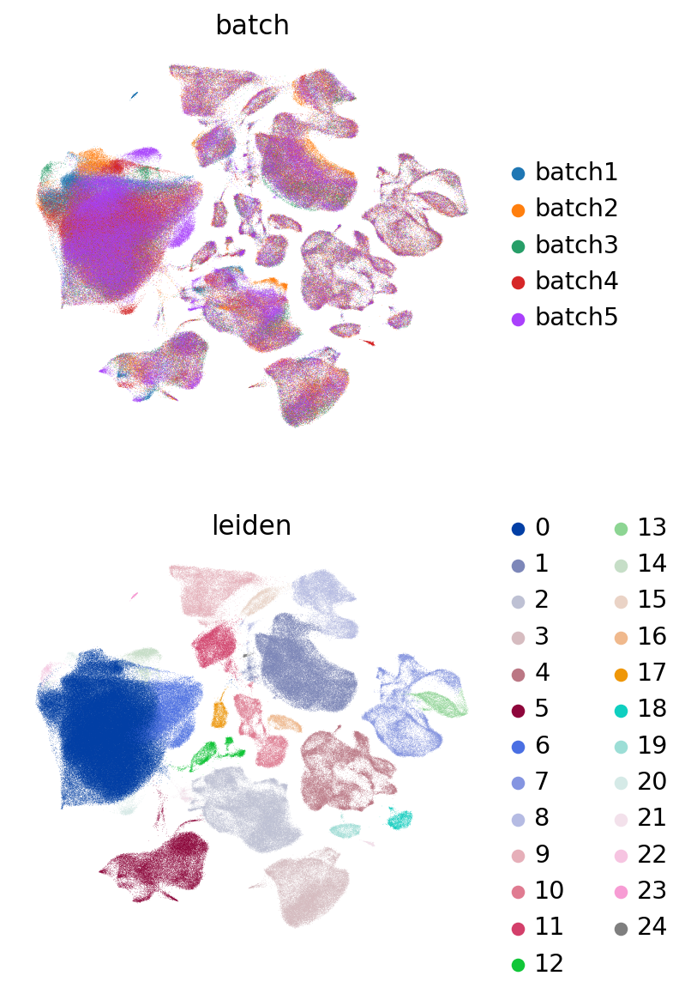

/home/ergonyc/mambaforge/envs/scverse11/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


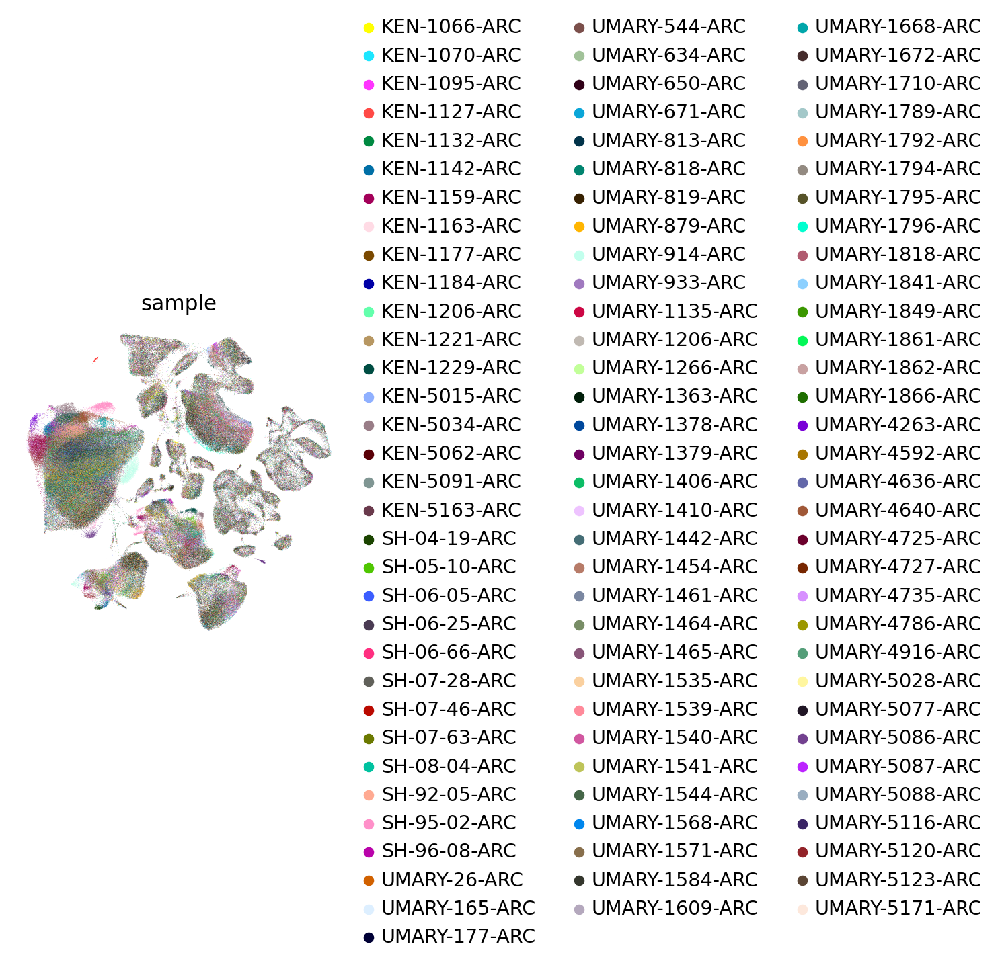

/home/ergonyc/mambaforge/envs/scverse11/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/ergonyc/mambaforge/envs/scverse11/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


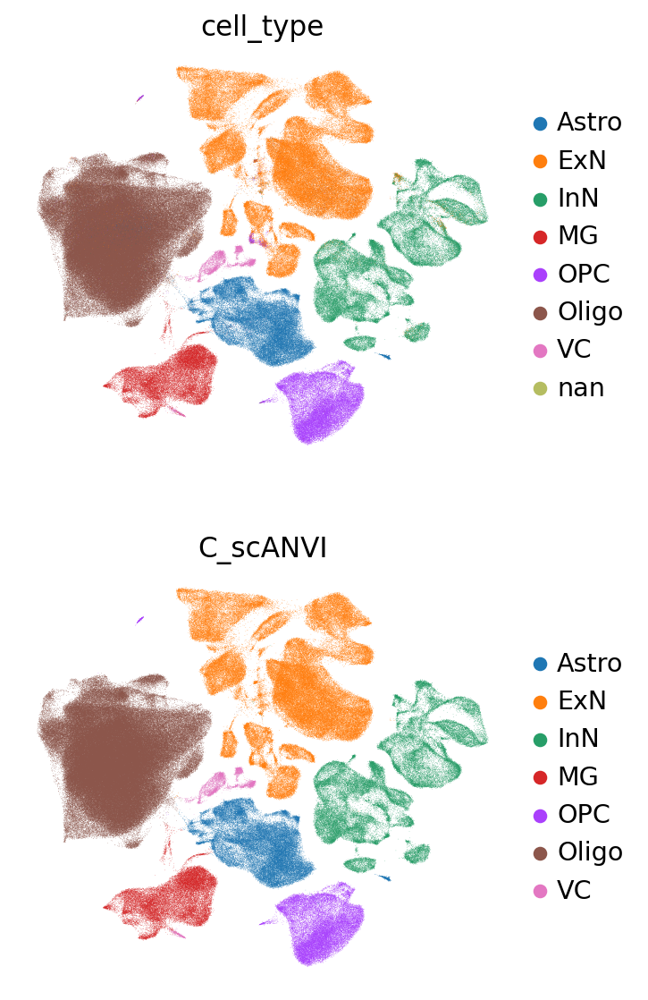

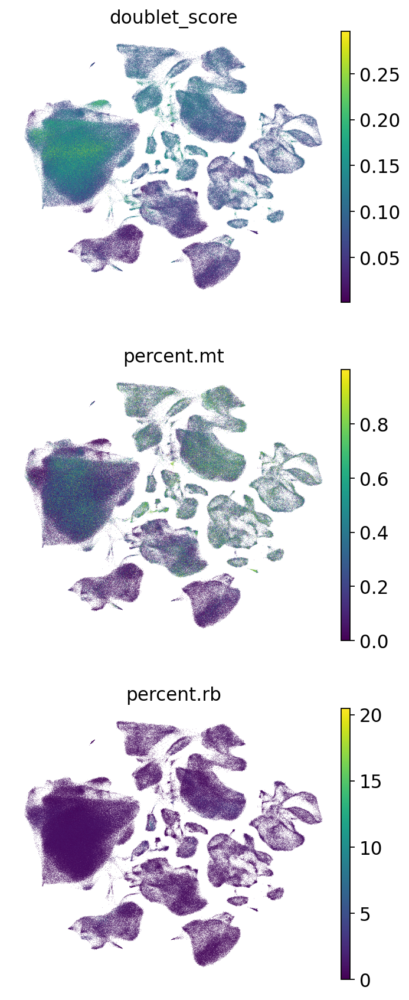

In [26]:

# add_nn_umap(train_ad, use_rep=SCANVI_LATENT_KEY, resolution = 0.25)
plot_umaps(train_ad, predict_key=SCANVI_PREDICTIONS_KEY, annot="TRAIN")

#### Update with query

We can load a new model with the query data either using

1. The saved reference model
1. The instance of the reference model

In [29]:
model_path = root_path / "models"


# save the reference model
vae_path = model_path / "vae.h5ad"

# dir_path = "/content/drive/MyDrive/SingleCellModel/model/"
vae_ref.save(vae_path, overwrite=True)

# save the reference model
# dir_path = "/content/drive/MyDrive/SingleCellModel/model/"
scanvi_path = model_path / "scanvi.h5ad"

scanvi_model.save(scanvi_path, overwrite=True)


In [132]:
vae_ref

SCVI Model with the following params: 
n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.2, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal
Training status: Trained
Model's adata is minified?: False

In [93]:
outp = scanvi_model.get_anndata_manager(val_ad)
print(outp)

None


In [95]:
val_ad._validate_anndata

AttributeError: 'AnnData' object has no attribute '_validate_anndata'

## Validation

In [37]:
### Validation

outfilen = data_path / XYLENA_ANNDATA.replace(".h5ad", "_val.h5ad")
val_ad = ad.read_h5ad(outfilen)


In [40]:
val_ad

AnnData object with n_obs × n_vars = 207726 × 3000
    obs: 'seurat_clusters', 'cell_type', 'sample', 'doublet_score', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rb', 'batch', 'S.Score', 'G2M.Score', 'Phase', 'RNA_snn_res.0.3', 'ExN1', 'InN2', 'MG3', 'Astro4', 'Oligo5', 'OPC6', 'VC7', 'type', 'UMAP_1', 'UMAP_2', 'clean', 'test', 'train'
    var: 'feat'

In [39]:
# train_ad.uns['_scvi_manager_uuid']

# scanvi_model.adata_manager.view_registry()

scvi.model.SCVI.prepare_query_anndata(val_ad, scanvi_model)

INFO     Found 100.0% reference vars in query data.                                                                


In [53]:

def _get_loaded_data(reference_model, device=None):
    from copy import deepcopy

    attr_dict = reference_model._get_user_attributes()
    attr_dict = {a[0]: a[1] for a in attr_dict if a[0][-1] == "_"}
    var_names = reference_model.adata.var_names
    load_state_dict = deepcopy(reference_model.module.state_dict())

    return attr_dict, var_names, load_state_dict


def _validate_var_names(adata, source_var_names):
    user_var_names = adata.var_names.astype(str)
    if not np.array_equal(source_var_names, user_var_names):
        print(
            "var_names for adata passed in does not match var_names of adata used to "
            "train the model. For valid results, the vars need to be the same and in "
            "the same order as the adata used to train the model.",
 
        )


In [54]:
query_ad = val_ad.copy() 

scvi.model.SCANVI.prepare_query_anndata(query_ad, scanvi_model, inplace=False)

adata = query_ad
reference_model = scanvi_model
device = "auto"
attr_dict, var_names, load_state_dict = _get_loaded_data(
    reference_model, device=device
)
inplace_subset_query_vars = False
if inplace_subset_query_vars:
    print("Subsetting query vars to reference vars.")
    adata._inplace_subset_var(var_names)

_validate_var_names(adata, var_names)

registry = attr_dict.pop("registry_")


INFO     Found 100.0% reference vars in query data.                                                                


In [55]:
registry

{'scvi_version': '1.0.4',
 'model_name': 'SCANVI',
 'setup_args': {'labels_key': 'cell_type',
  'unlabeled_category': 'Unknown',
  'layer': None,
  'batch_key': 'batch',
  'size_factor_key': None,
  'categorical_covariate_keys': None,
  'continuous_covariate_keys': ['doublet_score', 'percent.mt', 'percent.rb']},
 'field_registries': defaultdict(dict,
             {'X': {'data_registry': {'attr_name': 'X', 'attr_key': None},
               'state_registry': {'n_obs': 502085,
                'n_vars': 3000,
                'column_names': array(['PRDM16', 'SLC2A5', 'SPSB1', ..., 'LINC00278', 'PCDH11Y',
                       'AC064829.1'], dtype=object)},
               'summary_stats': {'n_vars': 3000, 'n_cells': 502085}},
              'batch': {'data_registry': {'attr_name': 'obs',
                'attr_key': '_scvi_batch'},
               'state_registry': {'categorical_mapping': array(['batch1', 'batch2', 'batch3', 'batch4', 'batch5'], dtype=object),
                'original_key': 

In [59]:
reference_model.__class__.__name__

'SCANVI'

In [87]:

scvi.model.SCANVI.load_query_data(query_ad, scanvi_model)


TypeError: '<' not supported between instances of 'float' and 'str'

In [44]:
model = scanvi_model
adata = query_ad



In [45]:
val = True
adata = model._validate_anndata(adata)


ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.2, dispersion: gene, 
gene_likelihood: zinb
Training status: Trained
Model's adata is minified?: False

ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.2, dispersion: gene, 
gene_likelihood: zinb
Training status: Trained
Model's adata is minified?: False

SCVI Model with the following params: 
n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.2, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal
Training status: Trained
Model's adata is minified?: False

ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.2, dispersion: gene, 
gene_likelihood: zinb
Training status: Trained
Model's adata is minified?: False

ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.2, dispersion: gene, 
gene_likelihood: zinb
Training status: Trained
Model's adata is minified?: False

SCVI Model with the following params: 
n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.2, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal
Training status: Trained
Model's adata is minified?: False

ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.2, dispersion: gene, 
gene_likelihood: zinb
Training status: Trained
Model's adata is minified?: False

ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.2, dispersion: gene, 
gene_likelihood: zinb
Training status: Trained
Model's adata is minified?: False

SCVI Model with the following params: 
n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.2, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal
Training status: Trained
Model's adata is minified?: False

ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.2, dispersion: gene, 
gene_likelihood: zinb
Training status: Trained
Model's adata is minified?: False

ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.2, dispersion: gene, 
gene_likelihood: zinb
Training status: Trained
Model's adata is minified?: False

SCVI Model with the following params: 
n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.2, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal
Training status: Trained
Model's adata is minified?: False

ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.2, dispersion: gene, 
gene_likelihood: zinb
Training status: Trained
Model's adata is minified?: False

ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.2, dispersion: gene, 
gene_likelihood: zinb
Training status: Trained
Model's adata is minified?: False

SCVI Model with the following params: 
n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.2, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal
Training status: Trained
Model's adata is minified?: False

ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.2, dispersion: gene, 
gene_likelihood: zinb
Training status: Trained
Model's adata is minified?: False

ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.2, dispersion: gene, 
gene_likelihood: zinb
Training status: Trained
Model's adata is minified?: False

SCVI Model with the following params: 
n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.2, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal
Training status: Trained
Model's adata is minified?: False

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


TypeError: '<' not supported between instances of 'float' and 'str'

In [ ]:

if indices is None:
    indices = np.arange(adata.n_obs)

scdl = model._make_data_loader(
    adata=adata,
    indices=indices,
    batch_size=batch_size,
)
y_pred = []
for _, tensors in enumerate(scdl):
    x = tensors[scvi.REGISTRY_KEYS.X_KEY]
    batch = tensors[scvi.REGISTRY_KEYS.BATCH_KEY]

    cont_key = scvi.REGISTRY_KEYS.CONT_COVS_KEY
    cont_covs = tensors[cont_key] if cont_key in tensors.keys() else None

    cat_key = scvi.REGISTRY_KEYS.CAT_COVS_KEY
    cat_covs = tensors[cat_key] if cat_key in tensors.keys() else None

    pred = model.module.classify(
        x, batch_index=batch, cat_covs=cat_covs, cont_covs=cont_covs
    )
    if not soft:
        pred = pred.argmax(dim=1)
    y_pred.append(pred.detach().cpu())

y_pred = torch.cat(y_pred).numpy()
if not soft:
    predictions = []
    for p in y_pred:
        predictions.append(model._code_to_label[p])

    return np.array(predictions)
else:
    n_labels = len(pred[0])
    pred = pd.DataFrame(
        y_pred,
        columns=model._label_mapping[:n_labels],
        index=adata.obs_names[indices],
    )
    return pred

In [ ]:

    def lpredict(
        model,
        adata: Optional[AnnData] = None,
        indices: Optional[Sequence[int]] = None,
        soft: bool = False,
        batch_size: Optional[int] = None,
    ) -> Union[np.ndarray, pd.DataFrame]:
        """Return cell label predictions.

        Parameters
        ----------
        adata
            AnnData object that has been registered via :meth:`~scvi.model.SCANVI.setup_anndata`.
        indices
            Return probabilities for each class label.
        soft
            If True, returns per class probabilities
        batch_size
            Minibatch size for data loading into model. Defaults to `scvi.settings.batch_size`.
        """
        adata = model._validate_anndata(adata)

        if indices is None:
            indices = np.arange(adata.n_obs)

        scdl = model._make_data_loader(
            adata=adata,
            indices=indices,
            batch_size=batch_size,
        )
        y_pred = []
        for _, tensors in enumerate(scdl):
            x = tensors[scvi.REGISTRY_KEYS.X_KEY]
            batch = tensors[scvi.REGISTRY_KEYS.BATCH_KEY]

            cont_key = scvi.REGISTRY_KEYS.CONT_COVS_KEY
            cont_covs = tensors[cont_key] if cont_key in tensors.keys() else None

            cat_key = scvi.REGISTRY_KEYS.CAT_COVS_KEY
            cat_covs = tensors[cat_key] if cat_key in tensors.keys() else None

            pred = model.module.classify(
                x, batch_index=batch, cat_covs=cat_covs, cont_covs=cont_covs
            )
            if not soft:
                pred = pred.argmax(dim=1)
            y_pred.append(pred.detach().cpu())

        y_pred = torch.cat(y_pred).numpy()
        if not soft:
            predictions = []
            for p in y_pred:
                predictions.append(model._code_to_label[p])

            return np.array(predictions)
        else:
            n_labels = len(pred[0])
            pred = pd.DataFrame(
                y_pred,
                columns=model._label_mapping[:n_labels],
                index=adata.obs_names[indices],
            )
            return pred

In [152]:
# hack to fix the cell_type dtype
val_ad.obs['cell_type'] = val_ad.obs['cell_type'].astype(str)

    # def setup_anndata(
    #     cls,
    #     adata: AnnData,
    #     layer: Optional[str] = None,
    #     batch_key: Optional[str] = None,
    #     labels_key: Optional[str] = None,
    #     size_factor_key: Optional[str] = None,
    #     categorical_covariate_keys: Optional[List[str]] = None,
    #     continuous_covariate_keys: Optional[List[str]] = None,
    #     **kwargs,
    # ):



scvi.model.SCVI.setup_anndata(val_ad, 
                              layer=layer, 
                              batch_key=batch, 
                              labels_key=labels,
                              continuous_covariate_keys=noise,
                              source_registry = scanvi_model.adata_manager.data_registry, # X contains raw counts
                              extend_categories=True)  # X contains raw counts

KeyError: "'field_registries'"

In [36]:
val_pred = scanvi_model.predict(query_ad)

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


TypeError: '<' not supported between instances of 'float' and 'str'

In [ ]:
adata.obs[SCANVI_PREDICTIONS_KEY] 

In [121]:
train_ad_process = train_ad.copy()


In [122]:

train_ad_process.layers['counts'] = train_ad_process.X.copy() # type: ignore
sc.pp.normalize_total(train_ad_process, target_sum=1e4)

sc.pp.log1p(train_ad_process)

train_ad_process.raw = train_ad_process

# scanpy.pp.highly_variable_genes(
#     train_ad_process, 
#     batch_key='sample', 
#     subset=True, 
#     flavor='seurat_v3', 
#     layer='counts', 
#     n_top_genes=3000
# )

In [120]:
train_ad.obsm['X_scVI'].shape, train_ad.shape, train_ad.obsm_keys()

((502085, 10),
 (502085, 3000),
 ['_scvi_extra_continuous_covs', 'X_scVI', 'X_umap'])

In [123]:
sc.tl.pca(train_ad_process, svd_solver='arpack')


: 

In [49]:
sc.pp.neighbors(train_ad_process, n_neighbors=10, n_pcs=40)


In [ ]:
sc.pp.neighbors(train_ad_process, n_neighbors=10, n_pcs=40)


In [51]:

sc.tl.leiden(train_ad_process, resolution=0.5)


In [53]:
sc.tl.umap(train_ad_process)


/home/ergonyc/mambaforge/envs/scverse11/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/ergonyc/mambaforge/envs/scverse11/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


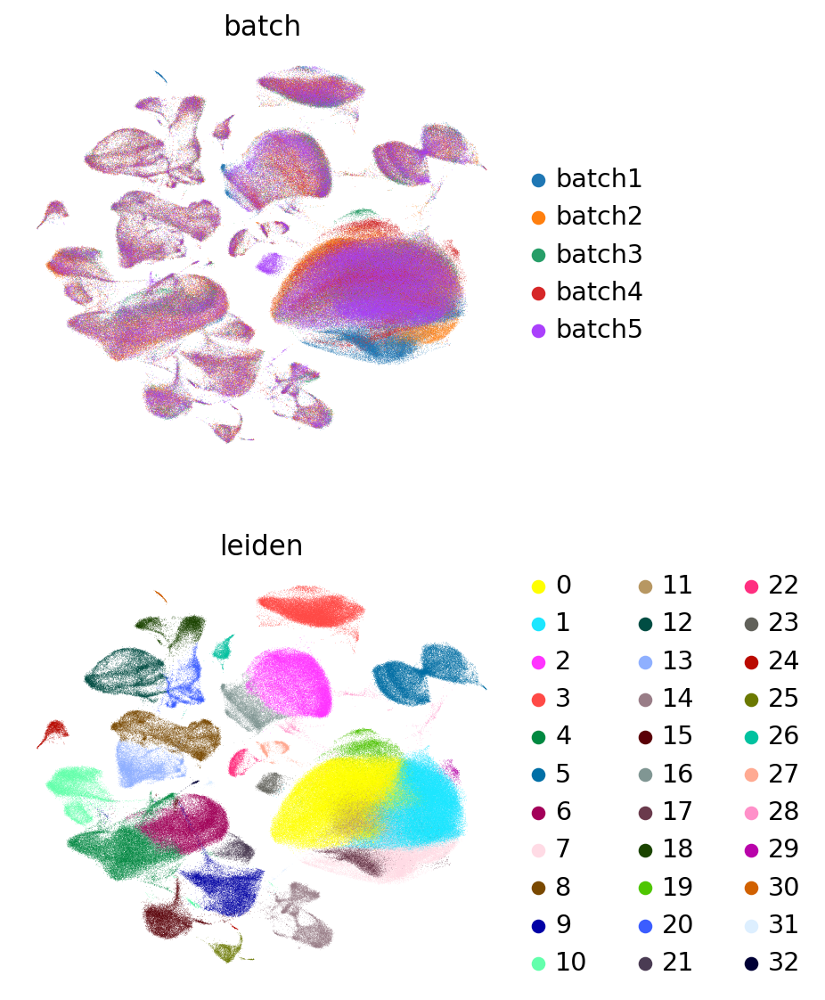

In [54]:
sc.pl.umap(
    train_ad_process,
    color=["batch", "leiden"],
    frameon=False,
    ncols=1,
)

/home/ergonyc/mambaforge/envs/scverse11/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


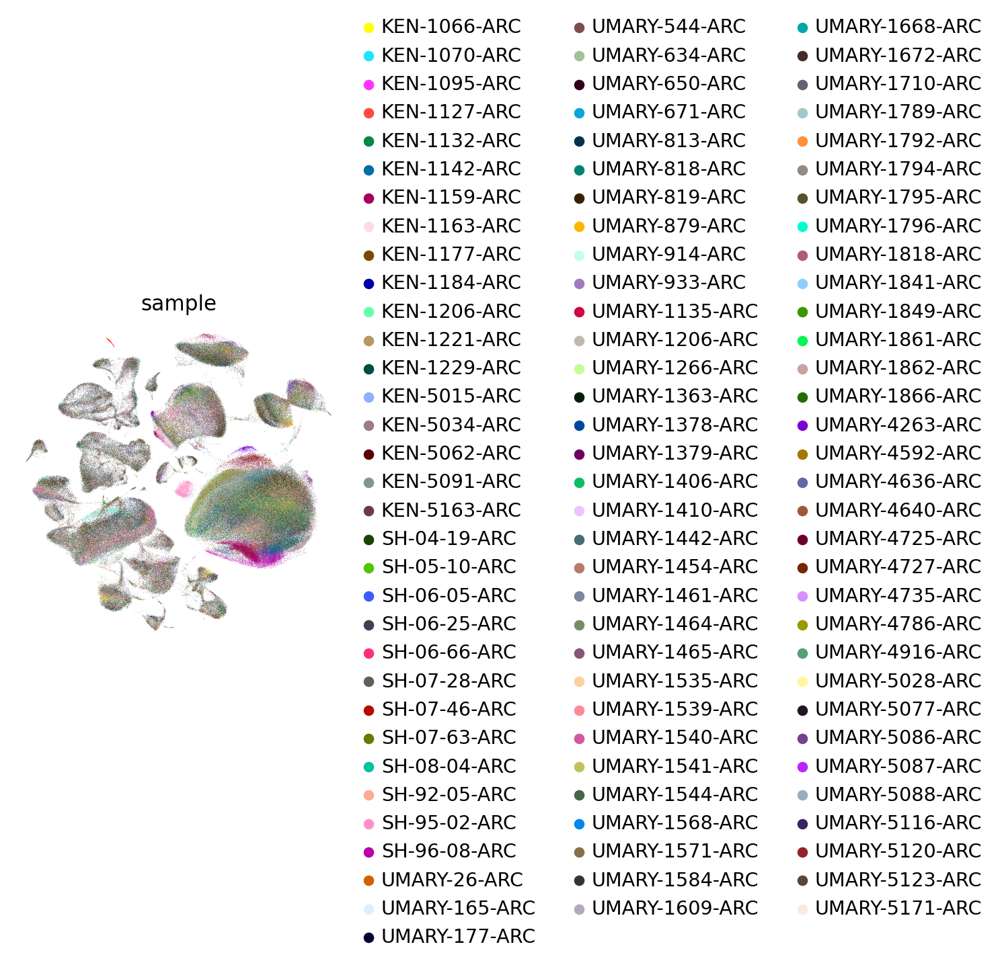

In [55]:
sc.pl.umap(
    train_ad_process,
    color=["sample"],
    frameon=False,
    ncols=1,
)

/home/ergonyc/mambaforge/envs/scverse11/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


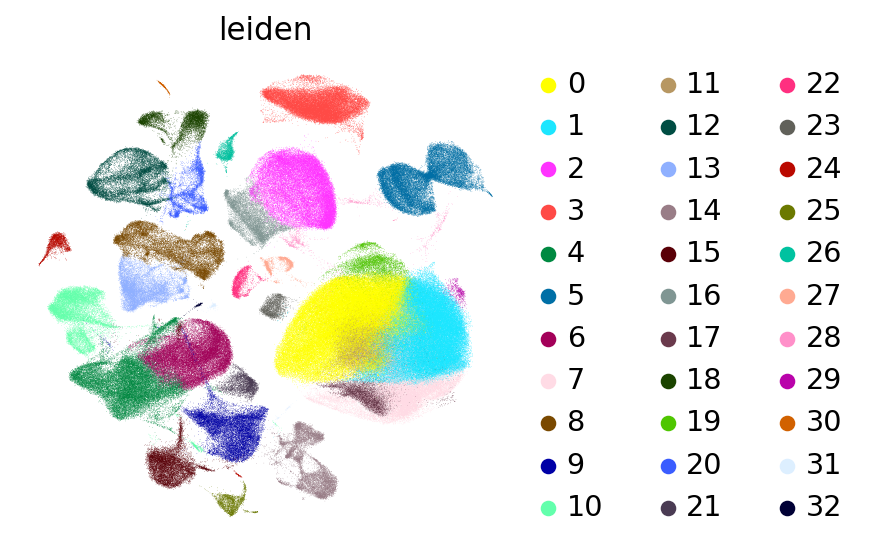

In [56]:
sc.pl.umap(
    train_ad_process,
    color=["leiden"],
    frameon=False,
    ncols=1,
)

/home/ergonyc/mambaforge/envs/scverse11/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


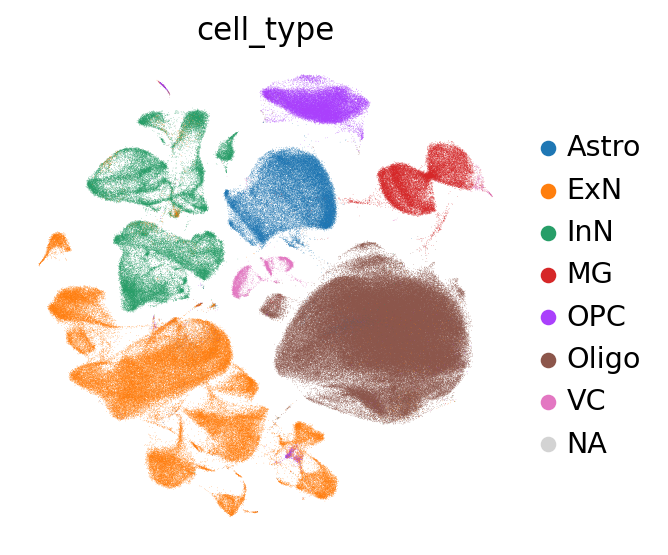

In [57]:
sc.pl.umap(
    train_ad_process,
    color= ["cell_type"],
    frameon=False,
    ncols=1,
)

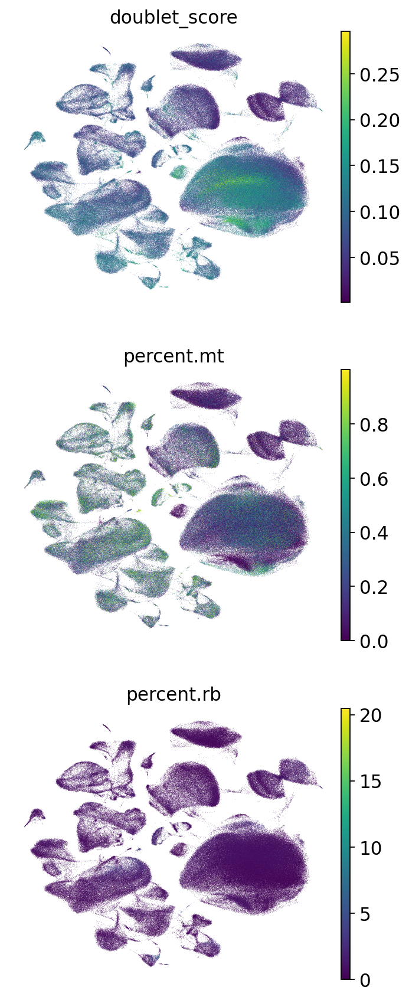

In [61]:
sc.pl.umap(
    train_ad_process,
    color= ["doublet_score", "percent.mt", "percent.rb"],
    frameon=False,
    ncols=1,
)

First we validate that our query data is ready to be loaded into the reference model. Here we run `prepare_query_anndata`, which reorders the genes and pads any missing genes with 0s. This should generally be run before reference mapping with scArches to ensure data correctness. In the case of this tutorial, nothing happens as the query data is already "correct".

In [74]:
# both are valid
# scvi.model.SCVI.prepare_query_anndata(adata_query, dir_path)
query_ad = scvi.model.SCVI.prepare_query_anndata(val_ad, vae_ref, inplace=False)


INFO     Found 100.0% reference vars in query data.                                                                


In [87]:

query_ad.obs['sample']

cells
TCTAGCCTCACCGGTA-1_2       KEN-1092-ARC
CCAACCAAGCTATTAG-1_2       KEN-1092-ARC
TGCATTAAGCCAGTAT-1_2       KEN-1092-ARC
AGCACAGCAATATACC-1_2       KEN-1092-ARC
ACTATGTCACTTGTTC-1_2       KEN-1092-ARC
                              ...      
ACTCGCTTCGCATTAA-1_135    UMARY-871-ARC
ACCAGGGAGCATGACT-1_135    UMARY-871-ARC
GACTTACAGTAAGTCC-1_135    UMARY-871-ARC
ACCAGGGAGGTCGATT-1_135    UMARY-871-ARC
ACGGGAAGTAAGCTTG-1_135    UMARY-871-ARC
Name: sample, Length: 207726, dtype: category
Categories (41, object): ['KEN-1092-ARC', 'KEN-1245-ARC', 'SH-03-15-ARC', 'SH-04-05-ARC', ..., 'UMARY-4906-ARC', 'UMARY-5114-ARC', 'UMARY-5117-ARC', 'UMARY-5179-ARC']

Now we create the new query model instance.

In [90]:
# # both are valid
# vae_q = scvi.model.SCVI.load_query_data(
#     adata_query,
#     dir_path,
# )
vae_q = scvi.model.SCVI.load_query_data(
    query_ad,
    vae_ref,
)

In [93]:
# X_scVI = vae_ref.get_latent_representation(query_ad)


This is a typical `SCVI` object, and after training, can be used in any defined way.

For training the query data, we recommend using a `weight_decay` of 0.0. This ensures the latent representation of the reference cells will remain exactly the same if passing them through this new query model.

In [99]:
arches_q_params = dict(
    weight_decay=0.0,
    use_layer_norm="both",
    use_batch_norm="none",
    encode_covariates=True,
    dropout_rate=0.2,
    n_layers=2,
)

vae_q_path = model_path / "vaeq.h5ad"

if vae_q_path.exists():
  vae_q = scvi.model.SCVI.load(vae_path.as_posix(), query_ad)
else:
  vae_q.train(plan_kwargs=dict(weight_decay=0.0))
  vae_q.save(vae_q_path, overwrite=True)



# if vae_path.exists():
#   vae_ref = scvi.model.SCVI.load(vae_path.as_posix(), train_ad)
# else:
#   vae_ref = scvi.model.SCVI(train_ad, **arches_params)
#   vae_ref.train()
  

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 39/39: 100%|██████████| 39/39 [04:24<00:00,  7.04s/it, v_num=1, train_loss_step=1.92e+3, train_loss_epoch=1.94e+3]

`Trainer.fit` stopped: `max_epochs=39` reached.


Epoch 39/39: 100%|██████████| 39/39 [04:24<00:00,  6.78s/it, v_num=1, train_loss_step=1.92e+3, train_loss_epoch=1.94e+3]


In [100]:
# adata_query.obsm["X_scVI"] = vae_q.get_latent_representation()
X_scVI = vae_q.get_latent_representation()

In [103]:
query_ad


AnnData object with n_obs × n_vars = 207726 × 3000
    obs: 'seurat_clusters', 'cell_type', 'sample', 'doublet_score', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rb', 'batch', 'S.Score', 'G2M.Score', 'Phase', 'RNA_snn_res.0.3', 'ExN1', 'InN2', 'MG3', 'Astro4', 'Oligo5', 'OPC6', 'VC7', 'type', 'UMAP_1', 'UMAP_2', 'clean', 'test', 'train', '_scvi_batch', '_scvi_labels'
    var: 'feat'
    uns: '_scvi_uuid', '_scvi_manager_uuid'
    obsm: '_scvi_extra_continuous_covs'

In [104]:

val_ad

AnnData object with n_obs × n_vars = 207726 × 3000
    obs: 'seurat_clusters', 'cell_type', 'sample', 'doublet_score', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rb', 'batch', 'S.Score', 'G2M.Score', 'Phase', 'RNA_snn_res.0.3', 'ExN1', 'InN2', 'MG3', 'Astro4', 'Oligo5', 'OPC6', 'VC7', 'type', 'UMAP_1', 'UMAP_2', 'clean', 'test', 'train'
    var: 'feat'

In [105]:
query_ad.obsm["X_scVI"] = vae_q.get_latent_representation()
sc.pp.neighbors(query_ad, use_rep="X_scVI")
# sc.tl.leiden(adata_ref)
# sc.tl.umap(adata_ref)

In [106]:
sc.tl.leiden(query_ad, resolution=0.5)


In [107]:

sc.tl.umap(query_ad)

/home/ergonyc/mambaforge/envs/scverse11/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/ergonyc/mambaforge/envs/scverse11/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


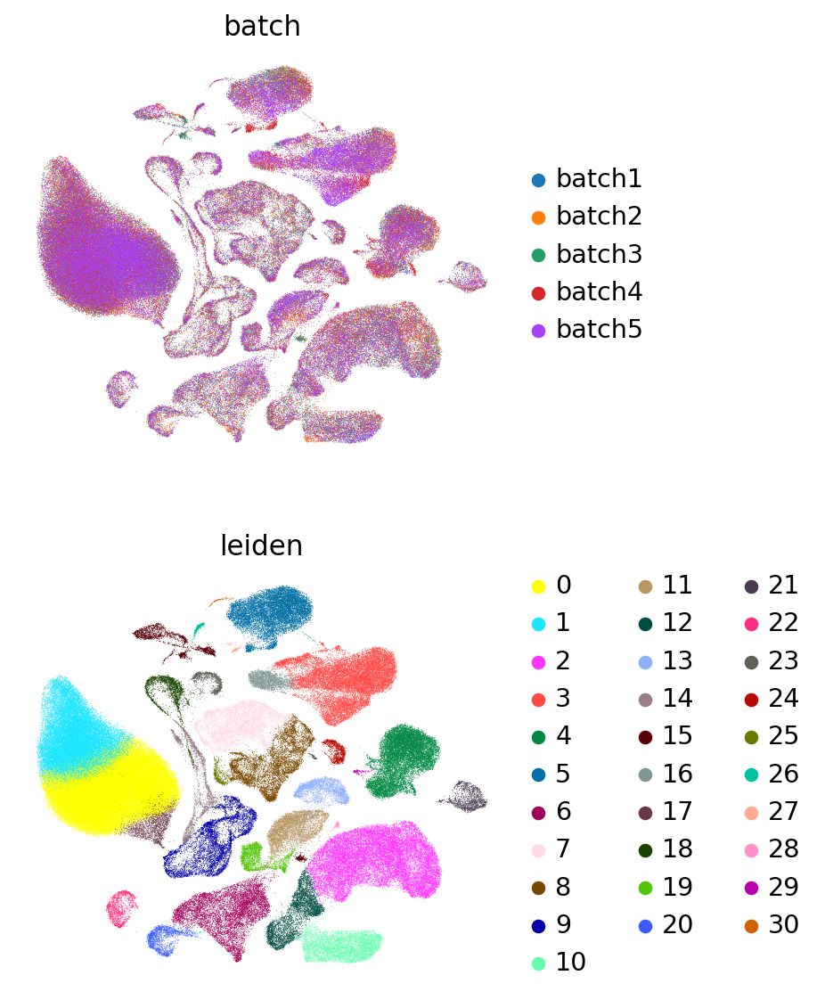

In [113]:
sc.pl.umap(
    query_ad,
    color=["batch", "leiden"],
    frameon=False,
    ncols=1,
)


/home/ergonyc/mambaforge/envs/scverse11/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


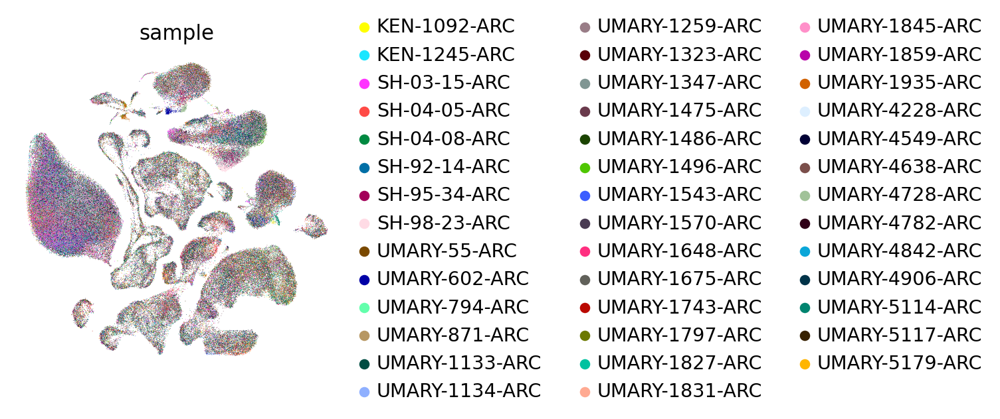

In [114]:
sc.pl.umap(
    query_ad,
    color=["sample"],
    frameon=False,
    ncols=1,
    save="q-batch-leiden.png"
)

/home/ergonyc/mambaforge/envs/scverse11/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


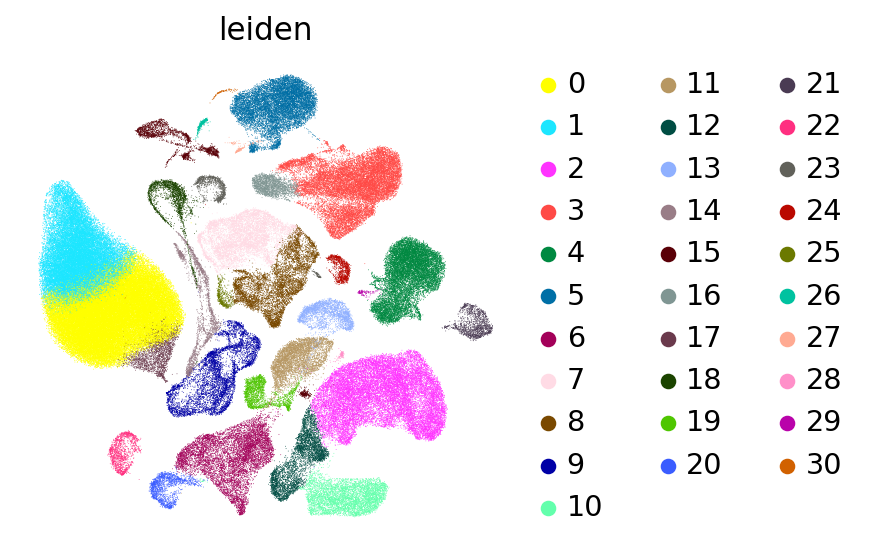

/home/ergonyc/mambaforge/envs/scverse11/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


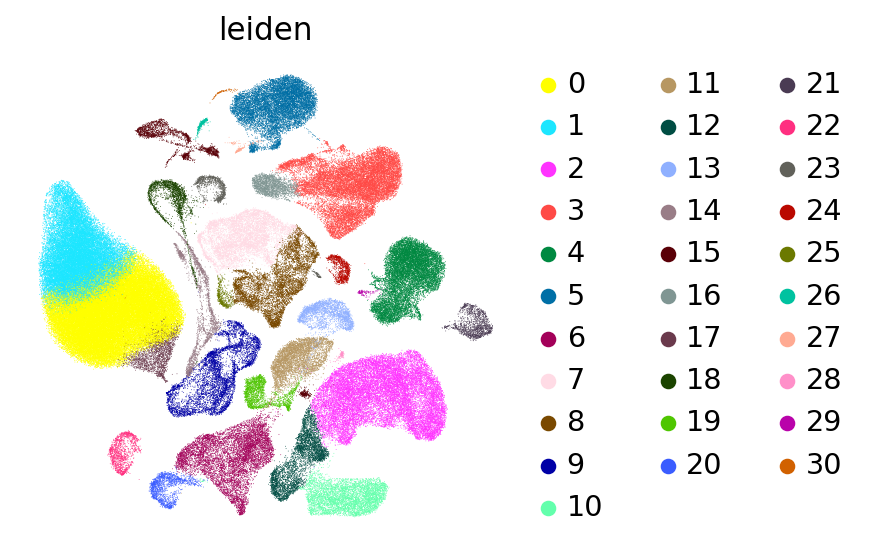

In [115]:
sc.pl.umap(
    query_ad,
    color=["leiden"],
    frameon=False,
    ncols=1,
)

sc.pl.umap(
    query_ad,
    color=["leiden"],
    frameon=False,
    ncols=1,
    save="q-leiden.png"
)

/home/ergonyc/mambaforge/envs/scverse11/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


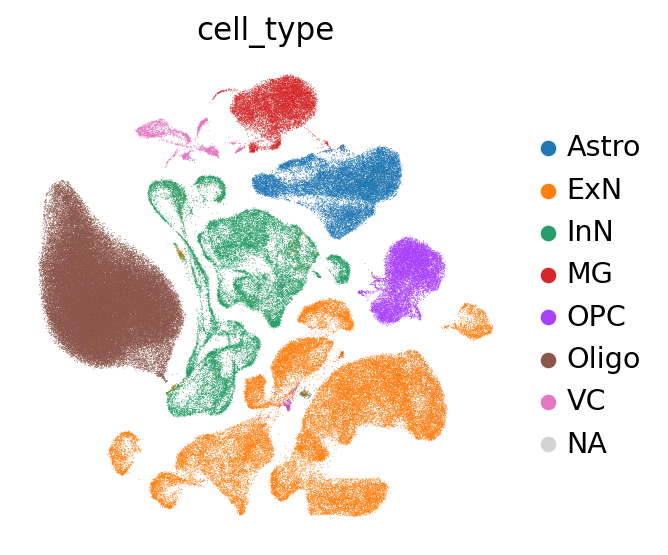

In [116]:
# sc.pl.umap(
#     query_ad,
#     color= ["cell_type"],
#     frameon=False,
#     ncols=1,
# )
sc.pl.umap(
    query_ad,
    color= ["cell_type"],
    frameon=False,
    ncols=1,
    save="q-cell_type.png"
)

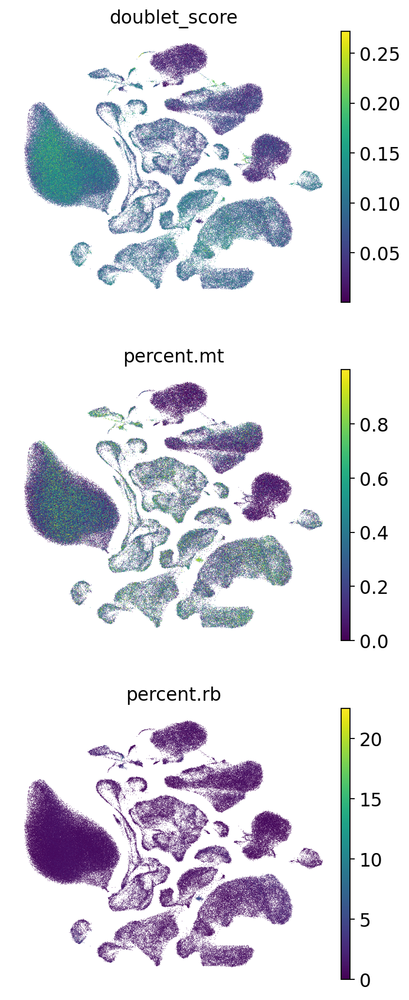

In [117]:
# sc.pl.umap(
#     query_ad,
#     color= ["doublet_score", "percent.mt", "percent.rb"],
#     frameon=False,
#     ncols=1,
# )
sc.pl.umap(
    query_ad,
    color= ["doublet_score", "percent.mt", "percent.rb"],
    frameon=False,
    ncols=1,
    save="q-noise.png"
)

In [ ]:
# save the reference model
# vae_q.save(vae_q_path, overwrite=True)

#### Visualize reference and query

In [ ]:
# adata_full = adata_query.concatenate(adata_ref)
adata_full = ad.concat( [adata_query,adata_ref] )


The concatenated object has the latent representations of both reference and query, but we are also able to reobtain these values using the query model.

In [ ]:
adata_full.obsm["X_scVI"] = vae_q.get_latent_representation(adata_full)

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


In [96]:
vae_ref.adata_manager.view_registry()

Anndata setup with scvi-tools version 1.0.4.

Setup via `SCVI.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'sample',
│   'labels_key': None,
│   'size_factor_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': ['doublet_score', 'percent.mt', 'percent.rb']
}

         Summary Statistics          
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓
┃     Summary Stat Key     ┃ Value  ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩
│         n_batch          │   97   │
│         n_cells          │ 502085 │
│ n_extra_categorical_covs │   0    │
│ n_extra_continuous_covs  │   3    │
│         n_labels         │   1    │
│          n_vars          │  3000  │
└──────────────────────────┴────────┘

                            Data Registry                            
┏━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃     Registry Key      ┃            scvi-tools Location            ┃
┡━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│           X           │                  adata.X                  │
│         batch         │         adata.obs['_scvi_batch']          │
│ extra_continuous_covs │ adata.obsm['_scvi_extra_continuous_covs'] │
│        labels         │         adata.obs['_scvi_labels']         │
└───────────────────────┴───────────────────────────────────────────┘

                     batch State Registry                     
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃   Categories   ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['sample'] │  KEN-1066-ARC  │          0          │
│                     │  KEN-1070-ARC  │          1          │
│                     │  KEN-1095-ARC  │          2          │
│                     │  KEN-1127-ARC  │          3          │
│                     │  KEN-1132-ARC  │          4          │
│                     │  KEN-1142-ARC  │          5          │
│                     │  KEN-1159-ARC  │          6          │
│                     │  KEN-1163-ARC  │          7          │
│                     │  KEN-1177-ARC  │          8          │
│                     │  KEN-1184-ARC  │          9          │
│                     │  KEN-1206-ARC  │         10          │
│                     │  KEN-1221-ARC  │         11          │
│                     │  KEN-1229-ARC  │         12          │
│                     │  KEN-5015-ARC  │         13          │
│                     │  KEN-5034-ARC  │         14          │
│                     │  KEN-5062-ARC  │         15          │
│                     │  KEN-5091-ARC  │         16          │
│                     │  KEN-5163-ARC  │         17          │
│                     │  SH-04-19-ARC  │         18          │
│                     │  SH-05-10-ARC  │         19          │
│                     │  SH-06-05-ARC  │         20          │
│                     │  SH-06-25-ARC  │         21          │
│                     │  SH-06-66-ARC  │         22          │
│                     │  SH-07-28-ARC  │         23          │
│                     │  SH-07-46-ARC  │         24          │
│                     │  SH-07-63-ARC  │         25          │
│                     │  SH-08-04-ARC  │         26          │
│                     │  SH-92-05-ARC  │         27          │
│                     │  SH-95-02-ARC  │         28          │
│                     │  SH-96-08-ARC  │         29          │
│                     │  UMARY-26-ARC  │         30          │
│                     │ UMARY-165-ARC  │         31          │
│                     │ UMARY-177-ARC  │         32          │
│                     │ UMARY-544-ARC  │         33          │
│                     │ UMARY-634-ARC  │         34          │
│                     │ UMARY-650-ARC  │         35          │
│                     │ UMARY-671-ARC  │         36          │
│                     │ UMARY-813-ARC  │         37          │
│                     │ UMARY-818-ARC  │         38          │
│                     │ UMARY-819-ARC  │         39          │
│                     │ UMARY-879-ARC  │         40          │
│                     │ UMARY-914-ARC  │         41          │
│                     │ UMARY-933-ARC  │         42          │
│                     │ UMARY-1135-ARC │         43          │
│                     │ UMARY-1206-ARC │         44          │
│                     │ UMARY-1266-ARC │         45          │
│                     │ UMARY-1363-ARC │         46          │
│                     │ UMARY-1378-ARC │         47          │
│                     │ UMARY-1379-ARC │         48          │
│                     │ UMARY-1406-ARC │         49          │
│                     │ UMARY-1410-ARC │         50          │
│                     │ UMARY-1442-ARC │         51          │
│                     │ UMARY-1454-ARC │         52          │
│                     │ UMARY-1461-ARC │         53          │
│                     │ UMARY-1464-ARC │         54          │
│                     │ UMARY-1465-ARC │         55          │
│                     │ UMARY-1535-ARC │         56          │
│                     │ UMARY-1539-ARC │         57          │
│                     │ UMARY-1540-ARC │         58          │
│                     │ UMARY-1

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

 extra_continuous_covs State  
           Registry           
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location       ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['doublet_score'] │
│  adata.obs['percent.mt']   │
│  adata.obs['percent.rb']   │
└────────────────────────────┘

In [ ]:
sc.pp.neighbors(adata_full, use_rep="X_scVI")
sc.tl.leiden(adata_full)
sc.tl.umap(adata_full)

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


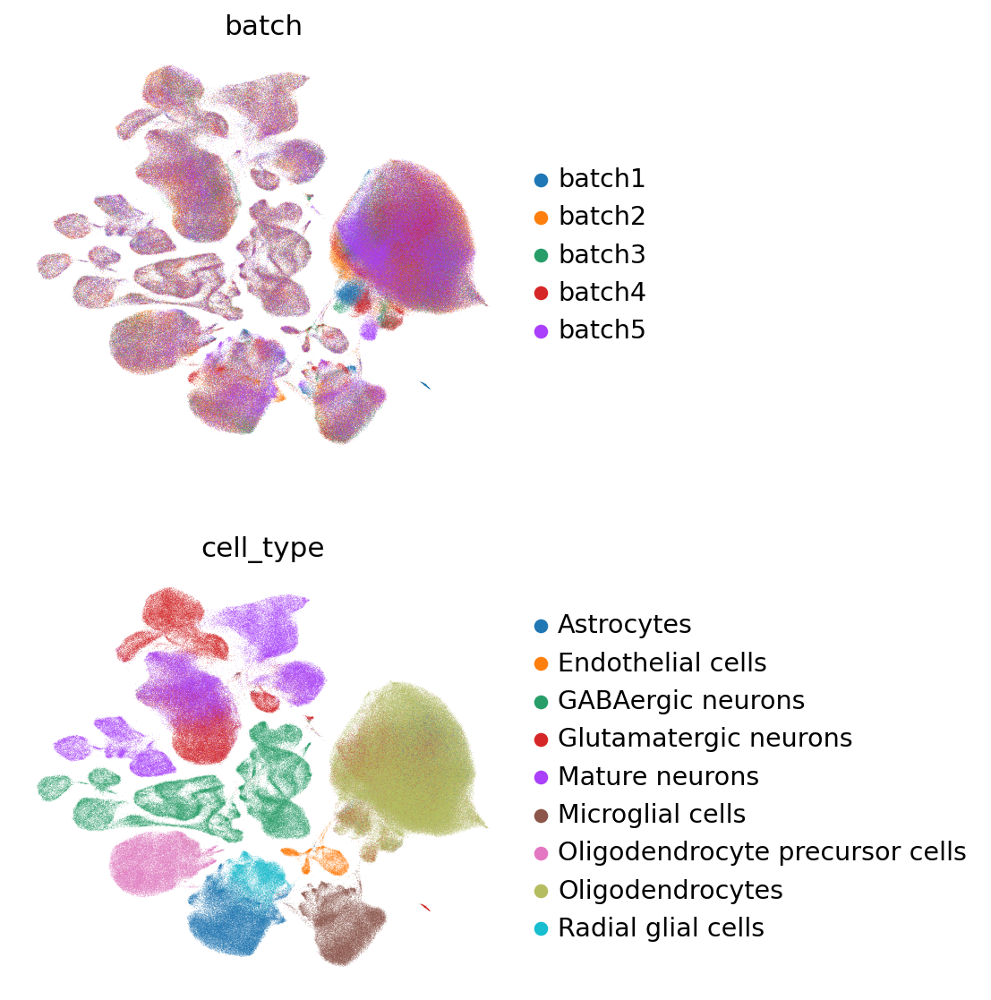

In [ ]:
sc.pl.umap(
    adata_full,
    color=["batch", "cell_type"],
    frameon=False,
    ncols=1,
)

In [ ]:
adata_ref.write_h5ad("/content/drive/MyDrive/SingleCellModel/adata_ref.h5ad")

adata_query.write_h5ad("/content/drive/MyDrive/SingleCellModel/adata_query.h5ad")
adata_full.write_h5ad("/content/drive/MyDrive/SingleCellModel/adata_full.h5ad")

In [ ]:
# raw = adata.raw.to_adata()


### Reference mapping with SCANVI

We'll use the same Pancreas dataset, this time we set it up such that we register that the dataset has labels.

The advantage of SCANVI is that we'll be able to predict the cell type labels of the query dataset. In the case of SCVI, a separate classifier (e.g., nearest-neighbor, random forest, etc.) would have to be trained on the reference latent space.

In [ ]:
adata_ref = ad.read_h5ad("/content/drive/MyDrive/SingleCellModel/adata_ref.h5ad")

# adata_query.write_h5ad("adata_query.h5ad")
# adata_full.write_h5ad("adata_full.h5ad")

vae_path = Path("/content/drive/MyDrive/SingleCellModel/model")
vae_ref = scvi.model.SCVI.load(val_ad.as_posix(), train_ad)




INFO     File /content/drive/MyDrive/SingleCellModel/model/model.pt already downloaded                             


#### Train reference

`SCANVI` tends to perform better in situations where it has been initialized using a pre-trained `SCVI` model. In this case, we will use `vae_ref` that we have already trained above. In other words, a typical `SCANVI` workflow will be:

```python
scvi_model = SCVI(adata_ref, **arches_params)
scvi_model.train()
scanvi_model = SCANVI.from_scvi_model(scvi_model, unlabeled_category="Unknown")
scanvi_model.train()
```

`SCANVI.from_scvi_model` will also run `setup_anndata`. It will use the `batch_key` and `layer` used with `SCVI`, but here we add the `labels_key`.

For this part of the tutorial, we will create a new labels key in the reference anndata object to reflect the common scenario of having no labels for the query data.

Applying this workflow in the context of this tutorial:

In [ ]:
adata_ref.obs["labels_scanvi"] = adata_ref.obs["cell_type"].values

In [ ]:
# unlabeled category does not exist in adata.obs[labels_key]
# so all cells are treated as labeled
vae_ref_scan = scvi.model.SCANVI.from_scvi_model(
    vae_ref,
    unlabeled_category="Unknown",
    labels_key="labels_scanvi",
)

In [ ]:
vae_ref_scan.train(max_epochs=20, n_samples_per_label=100)

INFO     Training for 20 epochs.                                                                                   


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 20/20: 100%|██████████| 20/20 [27:22<00:00, 81.95s/it, v_num=1, train_loss_step=2.3e+3, train_loss_epoch=1.92e+3] 

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [27:22<00:00, 82.11s/it, v_num=1, train_loss_step=2.3e+3, train_loss_epoch=1.92e+3]


In [ ]:
adata_ref.obsm["X_scANVI"] = vae_ref_scan.get_latent_representation()
sc.pp.neighbors(adata_ref, use_rep="X_scANVI")


KeyboardInterrupt: ignored

In [ ]:
sc.tl.leiden(adata_ref)
sc.tl.umap(adata_ref)

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


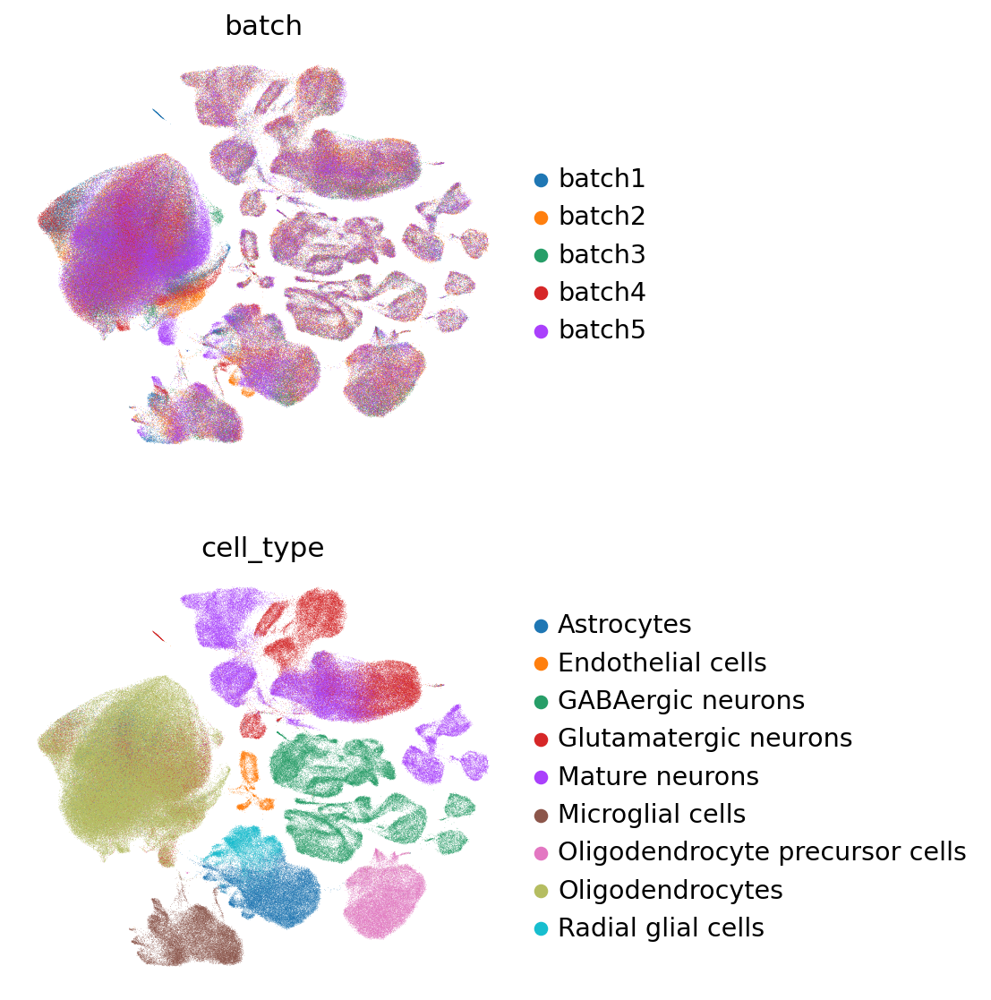

In [ ]:
sc.pl.umap(
    adata_ref,
    color=["batch", "cell_type"],
    frameon=False,
    ncols=1,
)

#### Update with query

In [ ]:
dir_path_scan =  "/content/drive/MyDrive/SingleCellModel/my_model_scanvi/"
# vae_ref_scan.save(dir_path_scan, overwrite=True)

In [ ]:
vae_ref_scan.save(dir_path_scan, overwrite=True)

In [ ]:
adata_query = ad.read_h5ad("/content/drive/MyDrive/SingleCellModel/adata_query.h5ad")


In [ ]:
# again a no-op in this tutorial, but good practice to use
scvi.model.SCANVI.prepare_query_anndata(adata_query, dir_path_scan)

INFO     File /content/drive/MyDrive/SingleCellModel/my_model_scanvi/model.pt already downloaded                   
INFO     Found 100.0% reference vars in query data.                                                                


Notice that `adata_query.obs["labels_scanvi"]` does not exist. The `load_query_data` method detects this and fills it in `adata_query` with the unlabeled category (here `"Unknown"`).

In [ ]:
vae_q = scvi.model.SCANVI.load_query_data(
    adata_query,
    dir_path_scan,
)

INFO     File /content/drive/MyDrive/SingleCellModel/my_model_scanvi/model.pt already downloaded                   


/usr/local/lib/python3.10/dist-packages/scvi/data/_manager.py:216: UserWarning: Missing labels key labels_scanvi. Filling in with unlabeled category Unknown.
  field_registry[_constants._STATE_REGISTRY_KEY] = field.transfer_field(


In [ ]:
vae_q.train(
    max_epochs=100,
    plan_kwargs=dict(weight_decay=0.0),
    check_val_every_n_epoch=10,
)


INFO     Training for 100 epochs.                                                                                  


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 100/100: 100%|██████████| 100/100 [41:46<00:00, 25.64s/it, v_num=1, train_loss_step=1.86e+3, train_loss_epoch=1.94e+3]

INFO: `Trainer.fit` stopped: `max_epochs=100` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|██████████| 100/100 [41:46<00:00, 25.07s/it, v_num=1, train_loss_step=1.86e+3, train_loss_epoch=1.94e+3]


In [ ]:
dir_path_qscan =  "/content/drive/MyDrive/SingleCellModel/my_qmodel_scanvi/"
vae_q.save(dir_path_qscan, overwrite=True)

In [ ]:
adata_query.obsm["X_scANVI"] = vae_q.get_latent_representation()
adata_query.obs["predictions"] = vae_q.predict()

Text(0, 0.5, 'Observed')

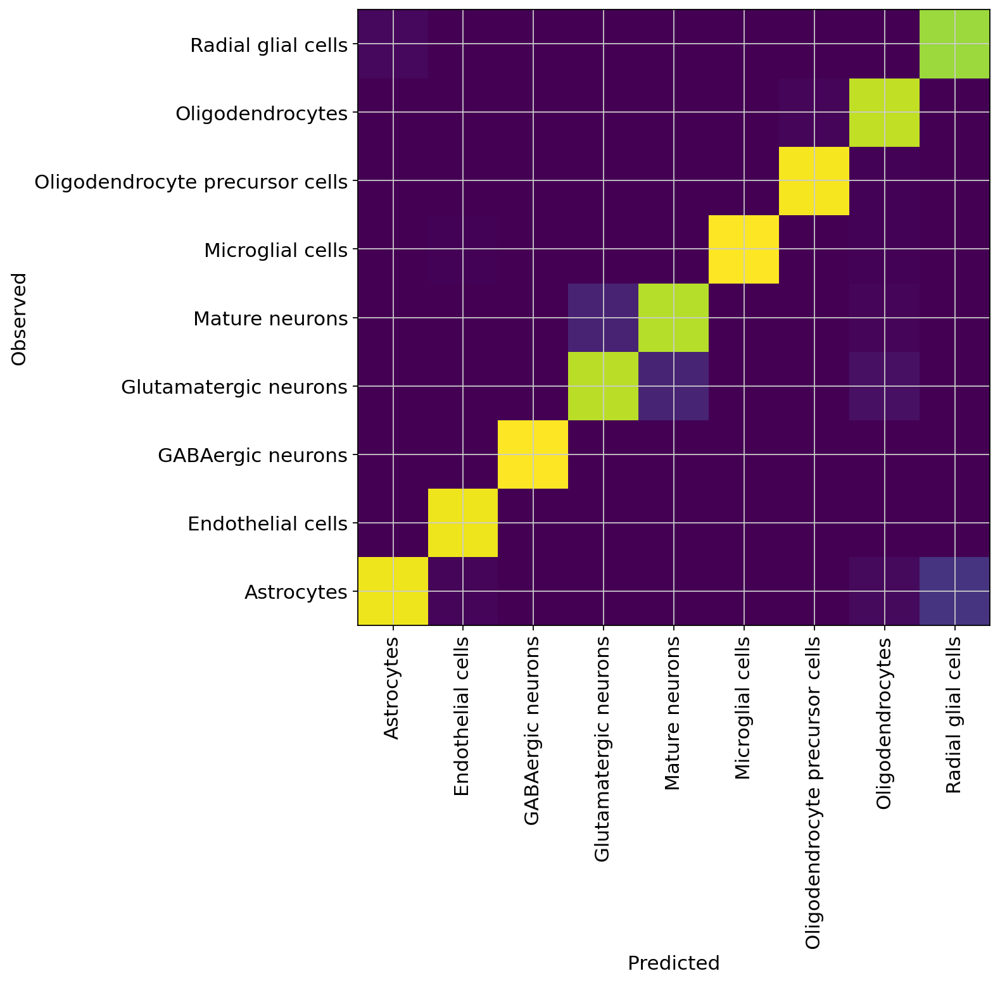

In [ ]:
df = adata_query.obs.groupby(["cell_type", "predictions"]).size().unstack(fill_value=0)
norm_df = df / df.sum(axis=0)

plt.figure(figsize=(8, 8))
_ = plt.pcolor(norm_df)
_ = plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns, rotation=90)
_ = plt.yticks(np.arange(0.5, len(df.index), 1), df.index)
plt.xlabel("Predicted")
plt.ylabel("Observed")

norm_df

#### Analyze reference and query

In [ ]:
# adata_full = adata_query.concatenate(adata_ref)
adata_full = ad.concat( [adata_ref, adata_query])



This just makes a column in the anndata corresponding to if the data come from the reference or query sets.

In [ ]:
adata_full.obs.batch.cat.rename_categories(["Query", "Reference"], inplace=True)

ValueError: ignored

In [ ]:
full_predictions = vae_q.predict(adata_full)
print(f"Acc: {np.mean(full_predictions == adata_full.obs.celltype)}")

adata_full.obs["predictions"] = full_predictions

In [ ]:
sc.pp.neighbors(adata_full, use_rep="X_scANVI")
sc.tl.leiden(adata_full)
sc.tl.umap(adata_full)

In [ ]:
# sc.pl.umap(
#     adata_full,
#     color=["tech", "celltype"],
#     frameon=False,
#     ncols=1,
# )

In [ ]:
sc.pl.umap(
    adata_full,
    color=["batch", "cell_type"],
    frameon=False,
    ncols=1,
)

In [ ]:
ax = sc.pl.umap(
    adata_full,
    frameon=False,
    show=False,
)
sc.pl.umap(
    adata_full[: adata_query.n_obs],
    color=["predictions"],
    frameon=False,
    title="Query predictions",
    ax=ax,
    alpha=0.7,
)

ax = sc.pl.umap(
    adata_full,
    frameon=False,
    show=False,
)
sc.pl.umap(
    adata_full[: adata_query.n_obs],
    color=["cell_type"],
    frameon=False,
    title="Query observed cell types",
    ax=ax,
    alpha=0.7,
)

In [ ]:
adata_ref.write_h5ad("/content/drive/MyDrive/SingleCellModel/scanvi_adata_ref.h5ad")

adata_query.write_h5ad("/content/drive/MyDrive/SingleCellModel/scanvi_adata_query.h5ad")
adata_full.write_h5ad("/content/drive/MyDrive/SingleCellModel/scanvi_adata_full.h5ad")

### Reference mapping with TOTALVI

This workflow works very similarly for TOTALVI. Here we demonstrate how to build a CITE-seq reference and use scRNA-seq only data as the query.

#### Assemble data

For totalVI, we will treat two CITE-seq PBMC datasets from 10X Genomics as the reference. These datasets were already filtered for outliers like doublets, as described in the totalVI manuscript. There are 14 proteins in the reference.

In [ ]:
adata_ref = scvi.data.pbmcs_10x_cite_seq()

INFO     Downloading file at data/pbmc_10k_protein_v3.h5ad                                   
Downloading...: 24938it [00:00, 119159.97it/s]                             
INFO     Downloading file at data/pbmc_5k_protein_v3.h5ad                                    
Downloading...: 100%|██████████| 18295/18295.0 [00:00<00:00, 109289.36it/s]


/usr/local/lib/python3.7/dist-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In general, there will be some necessary data wrangling. For example, we need to provide totalVI with some protein data -- and when it's all zeros, totalVI identifies that the protein data is missing in this "batch".

It could have also been the case that only some of the protein data was missing, in which case we would add zeros for each of the missing proteins.

In [ ]:
adata_query = scvi.data.dataset_10x("pbmc_10k_v3")
adata_query.obs["batch"] = "PBMC 10k (RNA only)"
# put matrix of zeros for protein expression (considered missing)
pro_exp = adata_ref.obsm["protein_expression"]
data = np.zeros((adata_query.n_obs, pro_exp.shape[1]))
adata_query.obsm["protein_expression"] = pd.DataFrame(
    columns=pro_exp.columns, index=adata_query.obs_names, data=data
)

INFO     Downloading file at data/10X/pbmc_10k_v3/filtered_feature_bc_matrix.h5              
Downloading...: 37492it [00:02, 18127.05it/s]                             


/usr/local/lib/python3.7/dist-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


We do some light QC filtering on the query dataset (doublets, mitochondrial, etc.)

In [ ]:
scrub = scr.Scrublet(adata_query.X)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
adata_query = adata_query[~predicted_doublets].copy()

adata_query.var["mt"] = adata_query.var_names.str.startswith(
    "MT-"
)  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(
    adata_query, qc_vars=["mt"], percent_top=None, log1p=False, inplace=True
)
adata_query = adata_query[adata_query.obs.pct_counts_mt < 15, :].copy()

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.33
Detected doublet rate = 4.7%
Estimated detectable doublet fraction = 55.3%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 8.6%
Elapsed time: 16.2 seconds


Now to concatenate the objects, which intersects the genes properly.

In [ ]:
adata_full = anndata.concat([adata_ref, adata_query])

/usr/local/lib/python3.7/dist-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


And split them back up into reference and query (but now genes are properly aligned between objects).

In [ ]:
adata_ref = adata_full[
    np.logical_or(adata_full.obs.batch == "PBMC5k", adata_full.obs.batch == "PBMC10k")
].copy()
adata_query = adata_full[adata_full.obs.batch == "PBMC 10k (RNA only)"].copy()

/usr/local/lib/python3.7/dist-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


We run gene selection on the reference, because that's all that will be avaialble to us at first.

In [ ]:
sc.pp.highly_variable_genes(
    adata_ref,
    n_top_genes=4000,
    flavor="seurat_v3",
    batch_key="batch",
    subset=True,
)

/usr/local/lib/python3.7/dist-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Finally, we use these selected genes for the query dataset as well.

In [ ]:
adata_query = adata_query[:, adata_ref.var_names].copy()

#### Train reference

In [ ]:
scvi.model.TOTALVI.setup_anndata(
    adata_ref, batch_key="batch", protein_expression_obsm_key="protein_expression"
)

INFO     Using column names from columns of adata.obsm['protein_expression']                 


In [ ]:
arches_params = dict(
    use_layer_norm="both",
    use_batch_norm="none",
)
vae_ref = scvi.model.TOTALVI(adata_ref, **arches_params)

INFO     Computing empirical prior initialization for protein background.                    


In [ ]:
vae_ref.train()

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:489: PossibleUserWarning: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test/predict dataloaders.
  category=PossibleUserWarning,


Epoch 400/400: 100%|██████████| 400/400 [06:13<00:00,  1.07it/s, loss=1.22e+03, v_num=1]


In [ ]:
adata_ref.obsm["X_totalVI"] = vae_ref.get_latent_representation()
sc.pp.neighbors(adata_ref, use_rep="X_totalVI")
sc.tl.umap(adata_ref, min_dist=0.4)

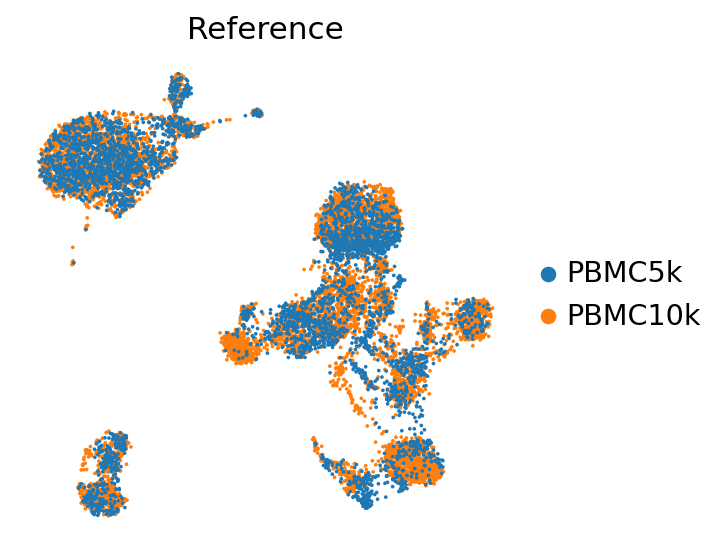

In [ ]:
sc.pl.umap(adata_ref, color=["batch"], frameon=False, ncols=1, title="Reference")

In [ ]:
dir_path = "saved_model/"
vae_ref.save(dir_path, overwrite=True)

#### Update with query

In [ ]:
scvi.model.TOTALVI.prepare_query_anndata(adata_query, dir_path)
vae_q = scvi.model.TOTALVI.load_query_data(
    adata_query,
    dir_path,
)

INFO     File saved_model/model.pt already downloaded                                        
INFO     Found 100.0% reference vars in query data.                                          
INFO     File saved_model/model.pt already downloaded                                        
INFO     Found batches with missing protein expression                                       
INFO     Computing empirical prior initialization for protein background.                    


/usr/local/lib/python3.7/dist-packages/scvi/model/_totalvi.py:133: UserWarning: Some proteins have all 0 counts in some batches. These proteins will be treated as missing measurements; however, this can occur due to experimental design/biology. Reinitialize the model with `override_missing_proteins=True`,to override this behavior.
  warnings.warn(msg, UserWarning)


In [ ]:
vae_q.train(200, plan_kwargs=dict(weight_decay=0.0))

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:489: PossibleUserWarning: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test/predict dataloaders.
  category=PossibleUserWarning,


Epoch 200/200: 100%|██████████| 200/200 [03:43<00:00,  1.12s/it, loss=759, v_num=1]


In [ ]:
adata_query.obsm["X_totalVI"] = vae_q.get_latent_representation()
sc.pp.neighbors(adata_query, use_rep="X_totalVI")
sc.tl.umap(adata_query, min_dist=0.4)

#### Impute protein data for query and visualize

Now that we have updated with the query, we can impute the proteins that were observed in the reference, using the `transform_batch` parameter.

In [ ]:
_, imputed_proteins = vae_q.get_normalized_expression(
    adata_query,
    n_samples=10,
    return_mean=True,
    transform_batch=["PBMC10k", "PBMC5k"],
)

Very quickly we can identify the major expected subpopulations of B cells, CD4 T cells, CD8 T cells, monocytes, etc.

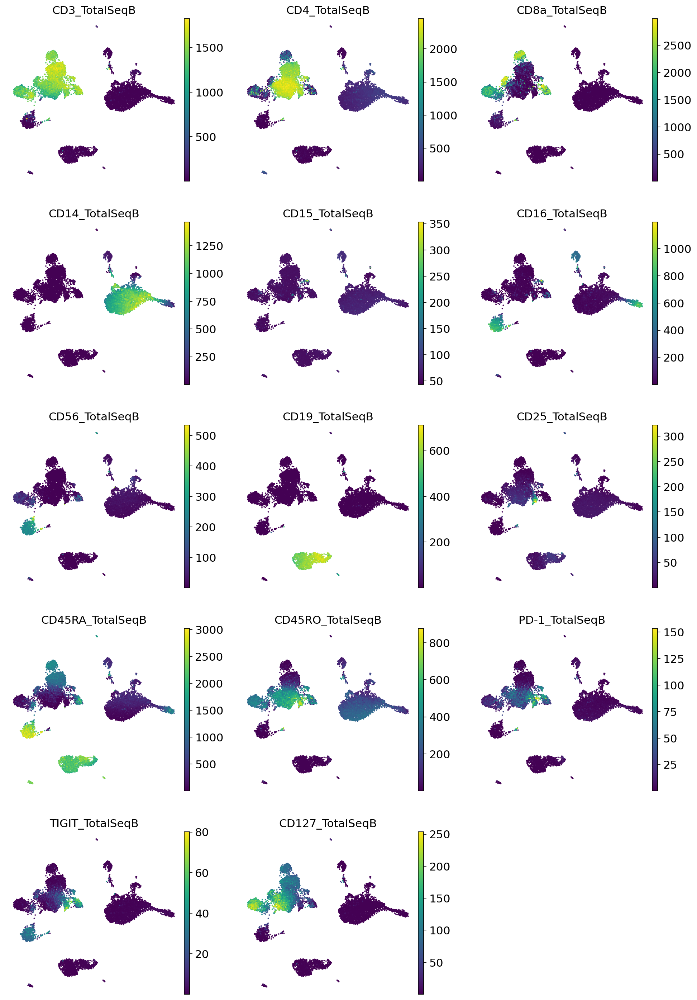

In [ ]:
adata_query.obs = pd.concat([adata_query.obs, imputed_proteins], axis=1)

sc.pl.umap(
    adata_query,
    color=imputed_proteins.columns,
    frameon=False,
    ncols=3,
)

#### Visualize reference and query

In [ ]:
adata_full_new = adata_query.concatenate(adata_ref, batch_key="none")

/usr/local/lib/python3.7/dist-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [ ]:
adata_full_new.obsm["X_totalVI"] = vae_q.get_latent_representation(adata_full_new)
sc.pp.neighbors(adata_full_new, use_rep="X_totalVI")
sc.tl.umap(adata_full_new, min_dist=0.3)

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup       
INFO     Found batches with missing protein expression                                       


In [ ]:
_, imputed_proteins_all = vae_q.get_normalized_expression(
    adata_full_new,
    n_samples=10,
    return_mean=True,
    transform_batch=["PBMC10k", "PBMC5k"],
)

for i, p in enumerate(imputed_proteins_all.columns):
    adata_full_new.obs[p] = imputed_proteins_all[p].to_numpy().copy()

/usr/local/lib/python3.7/dist-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/usr/local/lib/python3.7/dist-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


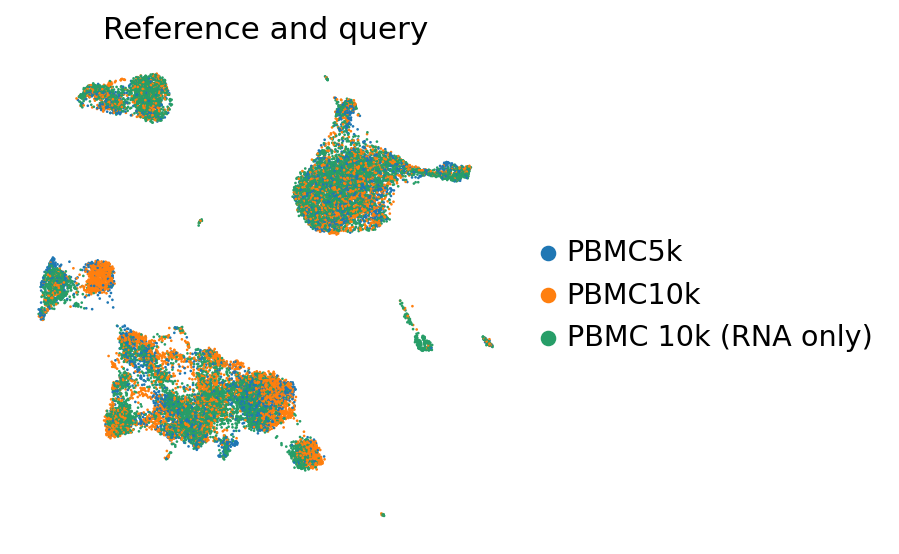

In [ ]:
perm_inds = np.random.permutation(np.arange(adata_full_new.n_obs))
sc.pl.umap(
    adata_full_new[perm_inds],
    color=["batch"],
    frameon=False,
    ncols=1,
    title="Reference and query",
)

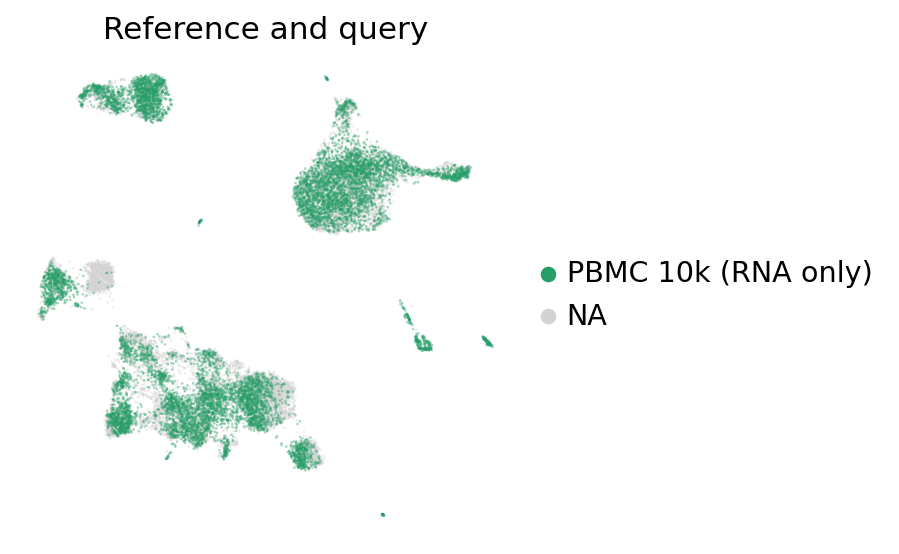

In [ ]:
ax = sc.pl.umap(
    adata_full_new,
    color="batch",
    groups=["PBMC 10k (RNA only)"],
    frameon=False,
    ncols=1,
    title="Reference and query",
    alpha=0.4,
)

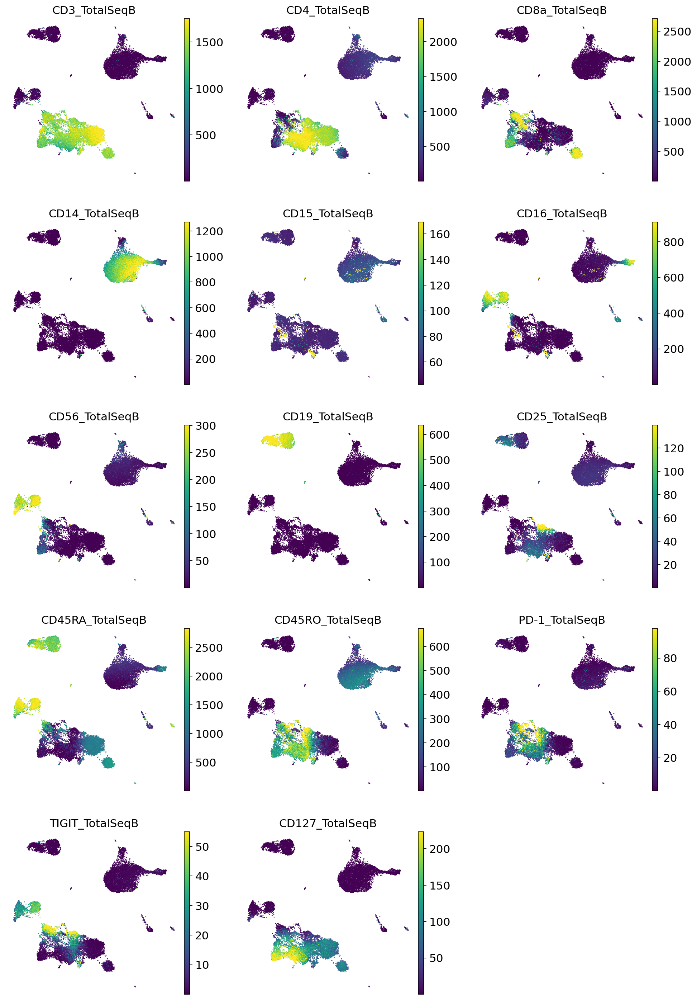

In [ ]:
sc.pl.umap(
    adata_full_new,
    color=imputed_proteins_all.columns,
    frameon=False,
    ncols=3,
    vmax="p99",
)